In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import nltk
import re
from keras.preprocessing import sequence
from collections import Counter
from datetime import datetime

### Data Cleaning Function Declarations

In [2]:
stopwords = set(nltk.corpus.stopwords.words('english'))
def cleantext(string):
    # Remove all punctuation
    string = re.sub(r"'s\b", '', string)
    string = re.sub(r'[^\w\s]', '', string)
    # Make all lowercase
    string = string.lower()
    # remove all stopwords
    string = ' '.join([word for word in string.split() if word not in stopwords])
    # Remove all special characters
    string = re.sub(r'\W+', ' ', string)
    return string


In [3]:
def lemmatize(string):
    lemmatizer = nltk.stem.WordNetLemmatizer()
    string = ' '.join([lemmatizer.lemmatize(word) for word in string.split()])
    return string

In [4]:
def preprocess(obj):
    obj = cleantext(obj)
    obj = lemmatize(obj)
    return obj

### Start of Data Preprocessing

In [5]:
data = pd.read_csv('../Datasets/news_data.csv', encoding='latin-1')

In [6]:
# remove all rows with null values
initial_data = data.dropna()

In [7]:
# apply data cleaning functions to the Title and Text
initial_data['Title'] = initial_data['Title'].apply(preprocess)
initial_data['Text'] = initial_data['Text'].apply(preprocess)

/var/folders/b_/r3vv94d920j081nfk44rgzqc0000gn/T/ipykernel_9819/566252149.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  initial_data['Title'] = initial_data['Title'].apply(preprocess)


KeyboardInterrupt: 

In [ ]:
# calculate term frequencies for texts, and store in dictionary term_freq
term_freq = {}
for text in initial_data['Text']:
    for word in text.split():
        if word in term_freq:
            term_freq[word] += 1
        else:
            term_freq[word] = 1

{'timothy': 942, 'clary': 13, 'afp': 653, 'getty': 5115, 'image': 21293, 'christie': 336, 'employee': 33833, 'take': 48178, 'bid': 14206, 'leonardo': 528, 'da': 1875, 'vincis': 1, 'salvator': 7, 'mundi': 14, 'new': 241729, 'york': 49689, 'november': 20864, '15': 60257, '2017': 383943, 'news': 62461, 'saudi': 15882, 'arabia': 7854, 'crown': 5597, 'prince': 6975, 'mohammed': 2615, 'bin': 2226, 'salman': 1411, 'bought': 6548, '450': 2898, 'million': 512079, 'vinci': 264, 'painting': 810, 'came': 17347, 'shock': 2256, 'western': 11455, 'world': 65376, 'followed': 9846, 'latest': 18011, 'series': 21691, 'jawdropping': 30, 'purchase': 32510, 'wall': 19419, 'street': 25252, 'journal': 6770, 'report': 99568, 'mystery': 409, 'buyer': 8318, 'salvatore': 176, 'auctioned': 294, 'last': 134009, 'month': 157192, 'â': 261785, 'highest': 15592, 'price': 112058, 'ever': 9349, 'paid': 23467, 'work': 44071, 'art': 5014, 'initially': 4672, 'time': 132901, 'reported': 64461, 'bander': 2, 'friend': 6493, 'p

Encode Labels into numerical values, and clean and tokenise the Text and Titles

In [ ]:
initial_data['Text'] = initial_data['Text'].apply(nltk.word_tokenize)
initial_data['Text_Sentiment'] = initial_data['Text_Sentiment'].apply(lambda x: 1 if x == 'positive' else (-1 if x == 'negative' else 0))



/var/folders/b_/r3vv94d920j081nfk44rgzqc0000gn/T/ipykernel_1673/2250675417.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  initial_data['Text'] = initial_data['Text'].apply(nltk.word_tokenize)
/var/folders/b_/r3vv94d920j081nfk44rgzqc0000gn/T/ipykernel_1673/2250675417.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  initial_data['Text_Sentiment'] = initial_data['Text_Sentiment'].apply(lambda x: 1 if x == 'positive' else (-1 if x == 'negative' else 0))


In [ ]:
# same as previous block but for Title
initial_data['Title'] = initial_data['Title'].apply(nltk.word_tokenize)
initial_data['Title_Sentiment'] = initial_data['Title_Sentiment'].apply(lambda x: 1 if x == 'positive' else (-1 if x == 'negative' else 0))

/var/folders/b_/r3vv94d920j081nfk44rgzqc0000gn/T/ipykernel_1673/4058319703.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  initial_data['Title'] = initial_data['Title'].apply(nltk.word_tokenize)
/var/folders/b_/r3vv94d920j081nfk44rgzqc0000gn/T/ipykernel_1673/4058319703.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  initial_data['Title_Sentiment'] = initial_data['Title_Sentiment'].apply(lambda x: 1 if x == 'positive' else (-1 if x == 'negative' else 0))


Get term frequencies for each word in the corpus

In [ ]:
# Get term frequencies for each word in the corpus
term_freq = Counter()
for row in initial_data['Text']:
    term_freq.update(row)
for row in initial_data['Title']:
    term_freq.update(row)
print(term_freq.most_common(10))

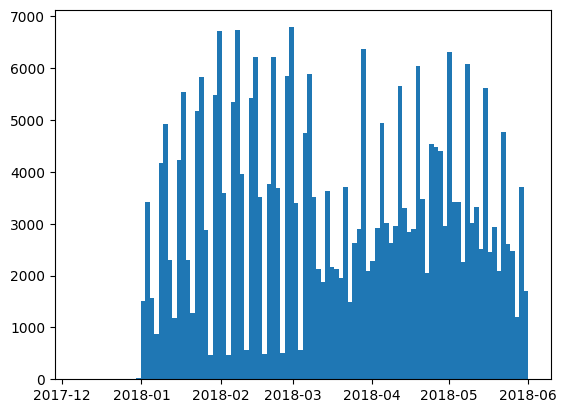

In [8]:
# Visualize the distribution of the articles over dates
dates = [datetime.strptime(date, '%Y-%m-%d') for date in initial_data['Date']]
plt.hist(dates, bins=100)
plt.show()

Map all words to integers

In [ ]:
from collections import Counter
all_words = [word for sublist in initial_data['Text'].tolist() for word in sublist]
all_words += [word for sublist in initial_data['Title'].tolist() for word in sublist]
word_count = Counter(all_words)
vocab_to_int = {word: index+1 for index, (word, _) in enumerate(word_count.items())}
initial_data["Text"] = initial_data["Text"].apply(lambda x: [vocab_to_int[word] for word in x if word in vocab_to_int])
initial_data["Title"] = initial_data["Title"].apply(lambda x: [vocab_to_int[word] for word in x if word in vocab_to_int])

/var/folders/b_/r3vv94d920j081nfk44rgzqc0000gn/T/ipykernel_1673/2339346396.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  initial_data["Text"] = initial_data["Text"].apply(lambda x: [vocab_to_int[word] for word in x if word in vocab_to_int])
/var/folders/b_/r3vv94d920j081nfk44rgzqc0000gn/T/ipykernel_1673/2339346396.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  initial_data["Title"] = initial_data["Title"].apply(lambda x: [vocab_to_int[word] for word in x if word in vocab_to_int])


Remove all articles less than 25 words

In [ ]:
initial_data = initial_data[initial_data['Text'].map(len) >= 25]
# truncate the text to 512 words
initial_data['Text'] = initial_data['Text'].apply(lambda x: x[:512])
initial_data.reset_index(drop=True, inplace=True)

Review lengths to choose a good truncation length

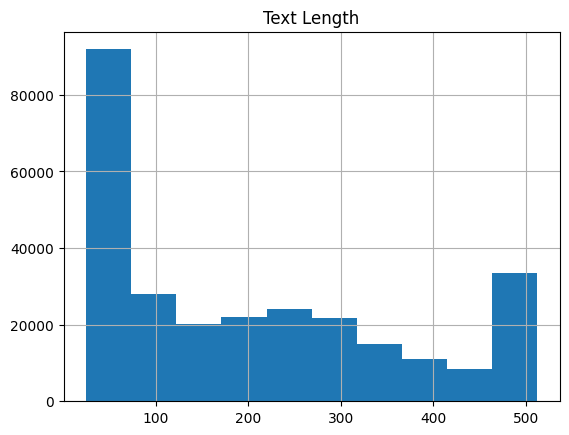

count    275312.000000
mean        204.333473
std         161.091882
min          25.000000
25%          56.000000
50%         166.000000
75%         314.000000
max         512.000000
dtype: float64

In [ ]:
text_int = initial_data["Text"].tolist()
sent_length = [len(x) for x in text_int]
plt.title("Text Length")
pd.Series(sent_length).hist()
plt.show()
pd.Series(sent_length).describe()

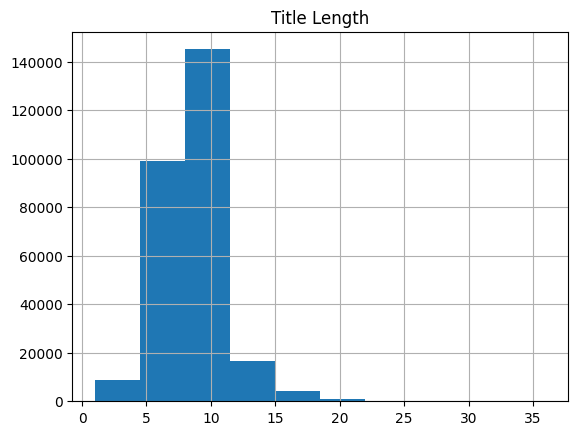

count    275312.000000
mean          8.267366
std           2.455256
min           1.000000
25%           7.000000
50%           8.000000
75%           9.000000
max          36.000000
dtype: float64

In [ ]:
title_int = initial_data["Title"].tolist()
sent_length = [len(x) for x in title_int]
# Add title to the top of the chart
plt.title('Title Length')
pd.Series(sent_length).hist()
plt.show()
pd.Series(sent_length).describe()

I have chosen length 381 as the ideal sequence length for text, as it is the 75th percentile of the lengths

In [ ]:
# postpad the text to 381 words (the 75th percentile)
initial_data["Text"] = list(sequence.pad_sequences(initial_data["Text"], maxlen=381, padding='post'))

I have chosen length 15 as the ideal sequence length for title

In [ ]:
# postpad the title to 15 words
initial_data["Title"] = list(sequence.pad_sequences(initial_data["Title"], maxlen=15, padding='post'))

In [ ]:
initial_data

,Date,Title,Text,Title_Sentiment,Text_Sentiment
0,2017-12-07,"[21, 24, 420, 28061, 6725, 41, 0, 0, 0, 0, 0, ...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",0,1
1,2017-12-07,"[214, 811, 4080, 45, 152, 153, 114, 0, 0, 0, 0...","[148, 149, 150, 151, 45, 152, 153, 154, 155, 1...",0,-1
2,2017-12-07,"[390, 4354, 391, 10718, 291, 445, 40610, 0, 0,...","[357, 358, 359, 360, 361, 362, 197, 363, 275, ...",0,1
3,2017-12-08,"[761, 762, 779, 777, 124272, 783, 28168, 760, ...","[751, 752, 753, 754, 733, 755, 756, 757, 758, ...",0,1
4,2017-12-08,"[665, 889, 8954, 714, 23, 918, 2435, 0, 0, 0, ...","[751, 752, 753, 879, 880, 881, 766, 882, 139, ...",1,1
...,...,...,...,...,...
275307,2018-06-01,"[12297, 12298, 2044, 65553, 3501, 391, 3737, 5...","[557, 595, 755, 27558, 1010, 218, 1840, 89, 12...",0,1
275308,2018-06-01,"[702687, 11465, 11890, 25110, 158, 712, 32915,...","[158, 712, 32915, 10055, 4927, 148, 11537, 144...",0,-1
275309,2018-06-01,"[8130, 167569, 68368, 4066, 2212, 241, 768375,...","[24596, 1249, 71303, 465397, 795, 3095, 7576, ...",0,1
275310,2018-06-01,"[158, 1594, 2323, 811, 5433, 15, 16, 807, 158,...","[15, 16, 1249, 158, 149, 159, 5412, 67029, 195...",1,1


Data is ready for processing with the model

### Processing the titles

Training = 80% of the data, Validation = 10% of the data, Testing = 10% of the data

In [ ]:
# Do 80 10 10 split on initial_data
   
from sklearn.model_selection import train_test_split

train_data, temp_data = train_test_split(initial_data, test_size=0.2, random_state=42)

validation_data, test_data = train_test_split(temp_data, test_size=0.5, random_state=42)

## Building the model: Keras

#### Model Architecture


Embedding layer will convert each word into a vector:
    - Input dimension is vocab size, and output dimension is 200 (chosen by me).

LSTM layer with 128 units. Dropout of 0.2 to prevent overfitting.

Dense layer with 64 units, and relu activation function.

Output layer with 3 unit, and softmax activation function.

Loss function: categorical crossentropy

In [ ]:
import keras

In [ ]:
vocab_size = len(vocab_to_int) + 1
embedding_dim = 100
max_length = 15
trunc_type='post'
padding_type='post'
oov_tok = "<OOV>"


In [ ]:
model = keras.Sequential([
    keras.layers.Embedding(len(vocab_to_int)+1, embedding_dim, input_length=max_length),
    keras.layers.Bidirectional(keras.layers.LSTM(64)),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(2, activation='sigmoid')
])

In [ ]:
model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 15, 100)           111780700 
                                                                 
 bidirectional_3 (Bidirecti  (None, 128)               84480     
 onal)                                                           
                                                                 
 dense_6 (Dense)             (None, 32)                4128      
                                                                 
 dense_7 (Dense)             (None, 2)                 66        
                                                                 
Total params: 111869374 (426.75 MB)
Trainable params: 111869374 (426.75 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
